<a href="https://colab.research.google.com/github/jyhyun1008/mikantone/blob/main/MIKANTONE_Pix2Pix2Vo(Model_Generator).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **MIKANTONE**

![logo](https://peachtart2.s3.ap-northeast-1.amazonaws.com/tart/1ea1bc6d-e2ba-4624-979a-915a9ac5e2af.webp)

description here

**혹시 데이터셋을 수동으로 만들기 어려우신 분 중, Logic Pro를 사용하시는 분들(혹은 미디를 직접 따는 쪽이 더 편하신 분들) 께서는 다음 링크를 체크해주세요!**

[MTD(Dataset Generator)](https://hiyuno.peacht.art/pychang/?p=dataset)

In [1]:
#@title Check GPU / GPU 체크 { display-mode: "form" }
!nvidia-smi

Tue Apr  9 05:21:04 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   47C    P8              10W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [2]:
#@title Mount Google Drive / 구글 드라이브 마운트 { display-mode: "form" }
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
#@title Copy Your Dataset / 구글 드라이브로부터 데이터셋 저장  { display-mode: "form" }

!mkdir -p "dataset"

#@markdown **We assume that your dataset(audio files, analyzed .txt file) is in your Google Drive's `mikantone/dataset/(DatasetName)` directory.**

#@markdown **구글 드라이브 내 `PyChang/dataset/(DatasetName)` 디렉토리에 음성 파일과 분석 파일을 저장해주세요.**
DatasetName = "kiritan" #@param {type: "string"}
!cp -R /content/drive/MyDrive/mikantone/dataset/{DatasetName}/ -t "dataset/"

# 1. Import Modules & Make Some Arrays / 필요한 모듈 임포트, 배열 생성

In [4]:
# python 표준 라이브러리
import os
import pathlib
import time
import datetime

# 오픈소스 라이브러리
from matplotlib.colors import LogNorm
from IPython import display
import tensorflow as tf
from tensorflow.python.keras import layers
import torch
import matplotlib.pyplot as plt
import numpy as np
import librosa
from scipy.io.wavfile import write

# Colab Notebook Library
import IPython.display as ipd

num = {'' : [0, 0, 0], ' ' : [0, 0, 0], 'a': [1, 0.7, 0.7], 'e': [1, 1, 0.7], 'i': [0.7, 1, 0.7], 'o': [0.7, 1, 1], 'u': [0.7, 0.7, 1],
       'w': [0.7, 0.7, 1], 'y':[0.7, 1, 0.7], 'h': [0.7, 0.7, 0.7], 'f': [0.7, 0.7, 0.7],
       'r': [1, 0.4, 0.4], 'n': [0.4, 1, 0.4], 'N': [0.5, 1, 0.5], 'm': [0.4, 0.4, 1],
       'g': [0.3, 0, 0], 'd': [0, 0.3, 0], 'b': [0, 0, 0.3], 'v': [0, 0, 0.7],
       'k': [0.1, 0, 0], 't': [0, 0.1, 0], 'T': [0, 0.05, 0], 'p': [0, 0, 0.1],
       's': [0.7, 0.4, 0.4], 'sh': [0.7, 0.4, 0.4], 'ch': [0.4, 0.7, 0.4], 'ts': [0.4, 0.7, 0.4], 'z': [0.4, 0.4, 0.7], 'j': [0.4, 0.4, 0.7]}

freqArray = np.multiply([98, 104, 110, 117, 123, 131, 139, 147, 156, 165, 175, 185, 196, 208, 220, 233, 247, 262, 277, 294, 311, 330, 349, 370, 392, 415, 440, 0], 1/5.55)
freqArray = freqArray.astype(int)
freqOneHot = tf.one_hot(freqArray, 1000)
for i in range(30):
  freqOneHot = tf.math.add(freqOneHot, tf.one_hot(np.multiply(freqArray, i+2), 1000, on_value=0.8))
  freqOneHot = tf.math.add(freqOneHot, tf.one_hot([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 600+10*i], 1000))
freqOneHot = tf.clip_by_value(freqOneHot, 0, 1)
freqOneHot_1 = tf.roll(freqOneHot, 1, 1)
freqOneHot_2 = tf.roll(freqOneHot, -1, 1)
freqOneHot = tf.math.add(freqOneHot, freqOneHot_1)
freqOneHot = tf.math.add(freqOneHot, freqOneHot_2)

# 2. Guide for Text File Generation / 텍스트 파일 생성 시 주의사항

You can analyze your audio data [here](https://hiyuno.peacht.art/pychang/?p=dataset). You need .wav files and .mid files for analyzing. Midi files are not necessary if you know all the pitches of each notes.

[이곳](https://hiyuno.peacht.art/pychang/?p=dataset)에서 음성 데이터를 분석할 수 있습니다. .wav 파일과 .mid 파일이 필요합니다. 만일 각 노트의 피치, 즉. 멜로디를 알고 있다면 미디 파일은 그다지 필요없을지도 모릅니다.

* Time is measured in units of 30, representing 1 second. / 시간은 30단위가 1초입니다.
* The pitch starts at A2, which is considered 0. It increases by one semitone incrementally. / 피치는 A2가 0입니다. 이후 반음 단위로 1씩 올라갑니다. 현재 최대 G2까지 내릴 수 있고, A4까지 올릴 수 있습니다.
* Please input phonemes at the phoneme level, not the syllable level. / 음소는 음절 단위가 아니라 음소 단위로 입력해주세요.


# 3. Import Audio Data / 오디오 데이터 불러오기 (0.mp3, 1.mp3, 2.mp3 ...)

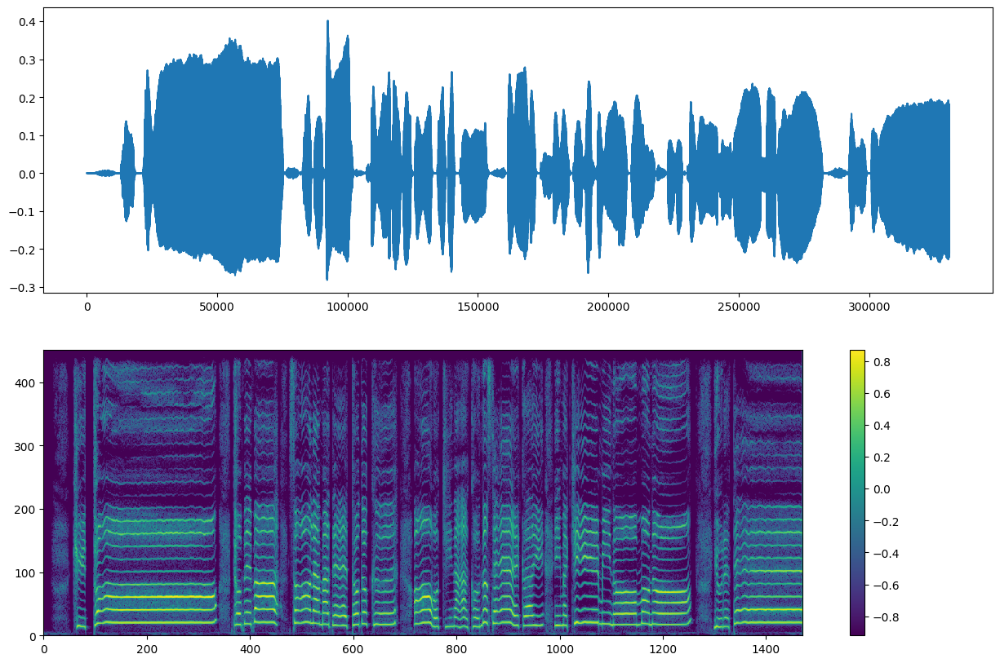

In [5]:
#@title How many audio files do you have? / 오디오 파일 갯수 { display-mode: "form" }

N_DataSet = 23 #@param {type:"number"}

dataArray = []

y = []
sr = []
Zxx = []
Zxx_abs = []

for i in range(N_DataSet):
  input_data = open('dataset/'+DatasetName+'/'+str(i)+'.txt', 'r')
  read = eval(input_data.read())
  if type(read) == list:
    dataArray.append([read])
  else :
    dataArray.append(list(read))

for i in range(N_DataSet):
  y.append(librosa.load('dataset/'+DatasetName+'/'+str(i)+'.wav')[0])
  sr.append(librosa.load('dataset/'+DatasetName+'/'+str(i)+'.wav')[1])
  Zxx.append(librosa.stft(y[i], n_fft=900))
  Zxx_abs.append(np.abs(Zxx[i]))
  Zxx_abs[i] = Zxx_abs[i]

Zxx_max = tf.reduce_max(Zxx_abs).numpy()
Zxx_abs = Zxx_abs / Zxx_max
Zxx_abs[Zxx_abs < 0.0001] = 0.0001
Zxx_abs_log = 1/5 * tf.math.log(100*Zxx_abs)

plt.figure(figsize=(15, 10))
plt.subplot(2, 1, 1)
plt.plot(y[0])

plt.subplot(2, 1, 2)
#plt.pcolormesh(Zxx_abs[0], norm=LogNorm(vmin=0.0001, vmax=1))
plt.pcolormesh(Zxx_abs_log[0])
plt.colorbar()
plt.show()

# 4. Preprocessing / 전처리

데이터셋의 길이에 따라서 10분 정도 걸릴 수 있습니다. T4 GPU 기준 100개당 3분 정도 걸립니다.

In [6]:
train_x = []
for i in range(N_DataSet):
  train_x.append([])
  for o in range(3):
      train_x[i].append([])
      for k in range(450):
        for l in range(len(dataArray[i])):
          if l == len(dataArray[i]) - 1:
            if k >= dataArray[i][l][0] * 2 / 60 * 30 and k < 450:
              train_x[i][o].append([np.multiply(freqOneHot[dataArray[i][l][1]+2],(num[dataArray[i][l][2]][o]))])
          else:
            if k >= dataArray[i][l][0] * 2 / 60 * 30 and k < dataArray[i][l+1][0] * 2 / 60 * 30:
              train_x[i][o].append([np.multiply(freqOneHot[dataArray[i][l][1]+2],(num[dataArray[i][l][2]][o]))])

train_y = []
for i in range(N_DataSet):
  train_y.append([])
  for o in range(3):
    train_y[i].append(tf.transpose(Zxx_abs_log[i]).numpy())

In [7]:
y_tensor = []
x_tensor = []
for i in range(N_DataSet):
  y_temp = tf.transpose(tf.cast(train_y[i], tf.float32))
  x_temp = tf.transpose(tf.squeeze(tf.cast(train_x[i], tf.float32), 2))
  for j in range(3):
    y_tensor.append(tf.image.resize(y_temp[:, j*492:(j+1)*492], [512, 512], antialias=True))
    x_tensor.append(tf.image.resize(x_temp[:, j*150:(j+1)*150], [512, 512], antialias=True))
x_tensor = tf.cast(x_tensor, tf.float32)
y_tensor = tf.cast(y_tensor, tf.float32)

trainTensor = tf.concat([x_tensor,y_tensor], axis=1)

# The facade training set consist of 400 images
BUFFER_SIZE = N_DataSet
# The batch size of 1 produced better results for the U-Net in the original pix2pix experiment
BATCH_SIZE = 1
# Each image is 256x256 in size
IMG_WIDTH = 512
IMG_HEIGHT = 512

OUTPUT_CHANNELS = 3

def resize(input_image, real_image, height, width):
  input_image = tf.image.resize(input_image, [height, width],
                                method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
  real_image = tf.image.resize(real_image, [height, width],
                               method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

  return input_image, real_image

def random_crop(input_image, real_image):
  stacked_image = tf.stack([input_image, real_image], axis=0)
  cropped_image = tf.image.random_crop(
      stacked_image, size=[2, IMG_HEIGHT, IMG_WIDTH, 3])

  return cropped_image[0], cropped_image[1]

@tf.function()
def random_jitter(input_image, real_image):
  # Resizing to 286x286
  input_image, real_image = resize(input_image, real_image, 512, 575)

  # Random cropping back to 256x256
  input_image, real_image = random_crop(input_image, real_image)

  return input_image, real_image

def load_image_train(input):
  x = input[:512]
  y = input[512:]
  x, y = random_jitter(x, y)
  return tf.cast(x, tf.float32), tf.cast(y, tf.float32)

def load_image_test(input):
  x = input[:512]
  y = input[512:]
  return tf.cast(x, tf.float32), tf.cast(y, tf.float32)

train_dataset = tf.data.Dataset.from_tensor_slices(trainTensor)
train_dataset = train_dataset.map(load_image_train,
                                  num_parallel_calls=tf.data.AUTOTUNE)
train_dataset = train_dataset.shuffle(BUFFER_SIZE)
train_dataset = train_dataset.batch(BATCH_SIZE)

test_dataset = tf.data.Dataset.from_tensor_slices(trainTensor)
test_dataset = test_dataset.map(load_image_test)
test_dataset = test_dataset.batch(BATCH_SIZE)

# 5. Define Models / 모델의 정의

In [8]:
def downsample(filters, size, apply_batchnorm=True):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()

  result.add(tf.keras.layers.Conv2D(filters, size, strides=2, padding='same', kernel_initializer=initializer, use_bias=False))

  if apply_batchnorm:
    result.add(tf.keras.layers.BatchNormalization())

  result.add(tf.keras.layers.LeakyReLU())

  return result

In [9]:
def upsample(filters, size, apply_dropout=False):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
    tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                    padding='same',
                                    kernel_initializer=initializer,
                                    use_bias=False))

  result.add(tf.keras.layers.BatchNormalization())

  if apply_dropout:
      result.add(tf.keras.layers.Dropout(0.5))

  result.add(tf.keras.layers.ReLU())

  return result

In [10]:
def Generator():

  inp = tf.keras.layers.Input(shape=[512, 512, 3])
  x = inp

  down_stack = [
    downsample(64, 4, apply_batchnorm=False),  # (batch_size, 128, 128, 64)
    downsample(128, 4),  # (batch_size, 128, 128, 64)
    downsample(256, 4),  # (batch_size, 128, 128, 64)
    downsample(256, 4),  # (batch_size, 64, 64, 128)
    downsample(256, 4),  # (batch_size, 32, 32, 256)
    downsample(256, 4),  # (batch_size, 16, 16, 512)
    downsample(512, 4),  # (batch_size, 8, 8, 512)
    downsample(512, 4),  # (batch_size, 4, 4, 512)
    downsample(512, 4),  # (batch_size, 2, 2, 512)
  ]

  up_stack = [
    upsample(512, 4, apply_dropout=True),  # (batch_size, 2, 2, 1024)
    upsample(512, 4, apply_dropout=True),  # (batch_size, 4, 4, 1024)
    upsample(512, 4, apply_dropout=True),  # (batch_size, 8, 8, 1024)
    upsample(256, 4),  # (batch_size, 64, 64, 256)
    upsample(256, 4),  # (batch_size, 64, 64, 256)
    upsample(256, 4),  # (batch_size, 128, 128, 128)
    upsample(128, 4),  # (batch_size, 64, 64, 256)
    upsample(64, 4),  # (batch_size, 128, 128, 128)
  ]

  initializer = tf.random_normal_initializer(0., 0.02)
  last = tf.keras.layers.Conv2DTranspose(OUTPUT_CHANNELS, 4,
                                         strides=2,
                                         padding='same',
                                         kernel_initializer=initializer,
                                         activation='tanh')  # (batch_size, 256, 256, 3)


  # Downsampling through the model
  skips = []
  for down in down_stack:
    x = down(x)
    skips.append(x)

  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    x = tf.keras.layers.Concatenate()([x, skip])

  x = last(x)

  return tf.keras.Model(inputs=inp, outputs=x)

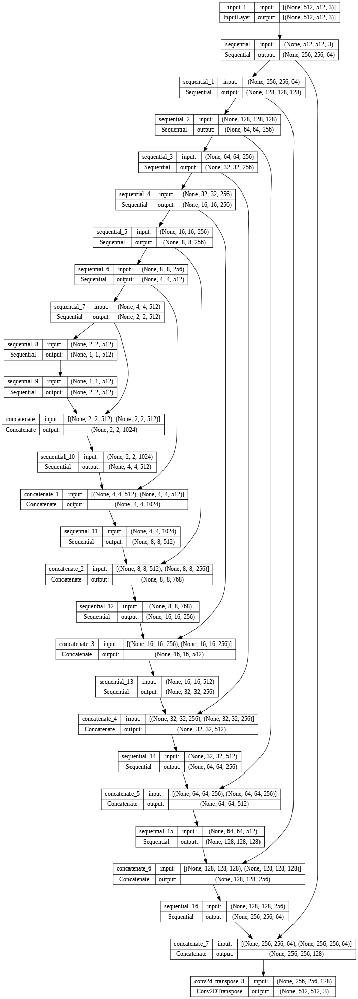

In [11]:
generator = Generator()
tf.keras.utils.plot_model(generator, show_shapes=True, dpi=64)

In [12]:
LAMBDA = 100
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def generator_loss(disc_generated_output, gen_output, target):
  gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)

  # Mean absolute error
  l1_loss = tf.reduce_mean(tf.abs(tf.image.resize(target, [512, 512]) - gen_output))

  total_gen_loss = gan_loss + (LAMBDA * l1_loss)

  return total_gen_loss, gan_loss, l1_loss

In [13]:
def downsample2(filters, size, apply_batchnorm=True):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()

  result.add(tf.keras.layers.Conv2D(filters, size, strides=1, padding='same', kernel_initializer=initializer, use_bias=False))

  if apply_batchnorm:
    result.add(tf.keras.layers.BatchNormalization())

  result.add(tf.keras.layers.LeakyReLU())

  return result

In [14]:
def Discriminator():
  initializer = tf.random_normal_initializer(0., 0.02)

  inp = tf.keras.layers.Input(shape=[None, 512, 3], name='input_image')
  tar = tf.keras.layers.Input(shape=[None, 512, 3], name='target_image')

  inp2 = tf.image.resize(inp, [512, 512], antialias=True)
  tar2 = tf.image.resize(tar, [512, 512], antialias=True)
  x = tf.keras.layers.concatenate([inp2, tar2])

  down1 = downsample(64, 4, False)(x)
  down2 = downsample(128, 4)(down1)
  down3 = downsample(256, 4)(down2)

  zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3)

  conv1 = tf.keras.layers.Conv2D(512, 4, strides=1,
                                kernel_initializer=initializer,
                                use_bias=False)(zero_pad1)

  batchnorm1 = tf.keras.layers.BatchNormalization()(conv1)

  leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)

  zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu)

  last = tf.keras.layers.Conv2D(1, 4, strides=1,
                                kernel_initializer=initializer)(zero_pad2)

  return tf.keras.Model(inputs=[inp, tar], outputs=last)

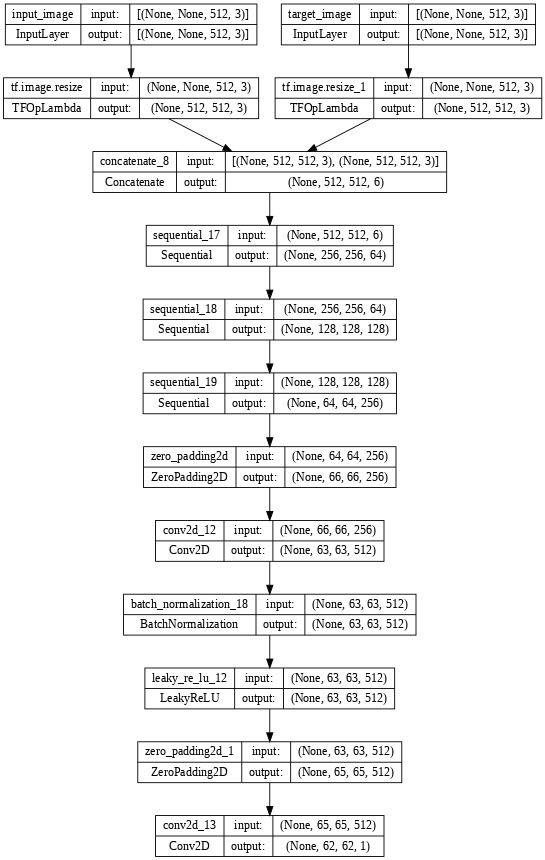

In [15]:
discriminator = Discriminator()
tf.keras.utils.plot_model(discriminator, show_shapes=True, dpi=64)

In [16]:
def discriminator_loss(disc_real_output, disc_generated_output):
  real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)

  generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

  total_disc_loss = real_loss + generated_loss

  return total_disc_loss

In [17]:
generator_optimizer = tf.keras.optimizers.legacy.Adam(5e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.legacy.Adam(1e-5, beta_1=0.5)

In [18]:
checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

In [19]:
def generate_images(model, test_input, tar):
  prediction = model(test_input, training=True)
  plt.figure(figsize=(17, 5))

  plt.subplot(1, 3, 1)
  r1 = tf.squeeze(tar, 0).numpy()[:, :, 0]
  #plt.pcolormesh(r1, norm=LogNorm(vmin=0.0001, vmax=1))
  plt.pcolormesh(r1)

  plt.subplot(1, 3, 2)
  r2 = tf.squeeze(test_input, 0).numpy()
  plt.imshow(r2, origin='lower')

  plt.subplot(1, 3, 3)
  r3 = tf.squeeze(prediction, 0).numpy()[:, :, 0]
  #r3[r3 < 0.0001] = 0.0001
  #plt.pcolormesh(r3, norm=LogNorm(vmin=0.0001, vmax=1))
  plt.pcolormesh(r3)
  plt.show()

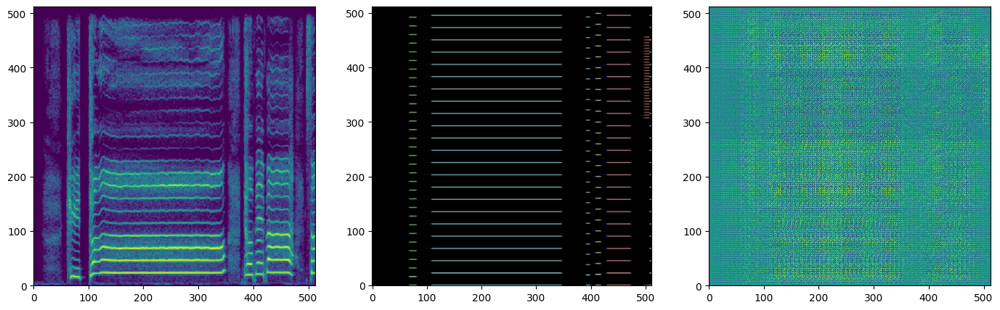

In [20]:
for example_input, example_target in test_dataset.take(1):
  generate_images(generator, example_input, example_target)

# 6. Fitting / 학습

## 6.1 Define Fitting Function / 피팅 함수 정의

In [21]:
@tf.function
def train_step(input_image, target, step):
  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    gen_output = generator(input_image, training=True)

    disc_real_output = discriminator([input_image, target], training=True)
    disc_generated_output = discriminator([input_image, gen_output], training=True)

    gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
    disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

  generator_gradients = gen_tape.gradient(gen_total_loss,
                                          generator.trainable_variables)
  discriminator_gradients = disc_tape.gradient(disc_loss,
                                               discriminator.trainable_variables)

  generator_optimizer.apply_gradients(zip(generator_gradients,
                                          generator.trainable_variables))
  discriminator_optimizer.apply_gradients(zip(discriminator_gradients,
                                              discriminator.trainable_variables))

  with summary_writer.as_default():
    tf.summary.scalar('gen_total_loss', gen_total_loss, step=step)
    tf.summary.scalar('gen_gan_loss', gen_gan_loss, step=step)
    tf.summary.scalar('gen_l1_loss', gen_l1_loss, step=step)
    tf.summary.scalar('disc_loss', disc_loss, step=step)

In [22]:
def fit(train_ds, test_ds, steps):
  example_input, example_target = next(iter(test_ds.take(1)))
  start = time.time()

  for step, (input_image, target) in train_ds.repeat().take(steps).enumerate():
    if (step) % 500 == 0:
      display.clear_output(wait=True)

      if step != 0:
        print(f'Time taken for 500 steps: {time.time()-start:.2f} sec\n')

      start = time.time()

      generate_images(generator, example_input, example_target)
      print(f"Step: {step/1000}k")

    train_step(input_image, target, step)

    # Training step
    if (step+1) % 10 == 0:
      print('.', end='', flush=True)

    # Save (checkpoint) the model every 5k steps
    if (step + 1) % 1000 == 0:
      checkpoint.save(file_prefix=checkpoint_prefix)

## 6.2 Load Tensorboard and Fitting / 텐서보드를 로드하고 피팅

In [23]:
#@title Load Tensorboard / 텐서보드 로드 { display-mode: "form" }

log_dir="logs/"

summary_writer = tf.summary.create_file_writer(
  log_dir + "fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

%reload_ext tensorboard
#%load_ext tensorboard
%tensorboard --logdir {log_dir}

<IPython.core.display.Javascript object>

Time taken for 500 steps: 86.96 sec



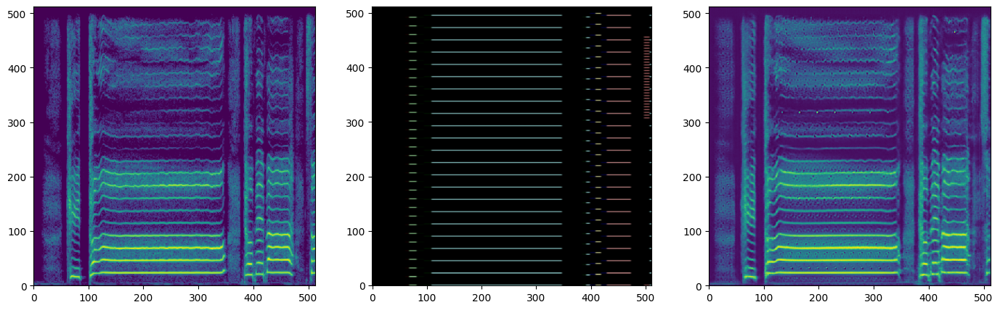

Step: 13.5k
..............................

In [24]:
#@title Fitting / 피팅 { display-mode: "form" }

N_loop = 600 #@param {type:"number"}

fit(train_dataset, test_dataset, N_DataSet*N_loop)

# 7. Postprocessing / 후가공

In [25]:
#@title Save Model to your Drive / 드라이브에 모델 저장 { display-mode: "form" }

!mkdir -p saved_model
!mkdir -p /content/drive/MyDrive/mikantone/models/{DatasetName}
generator.save('saved_model/MIKANTONE_Library_'+DatasetName+'.h5')

!cp -R "saved_model/" -t /content/drive/MyDrive/mikantone/models/{DatasetName}/

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(
/usr/local/lib/python3.10/dist-packages/keras/src/initializers/__init__.py:144: UserWarning: The `keras.initializers.serialize()` API should only be used for objects of type `keras.initializers.Initializer`. Found an instance of type <class 'tensorflow.python.ops.init_ops_v2.RandomNormal'>, which may lead to improper serialization.
  warnings.warn(


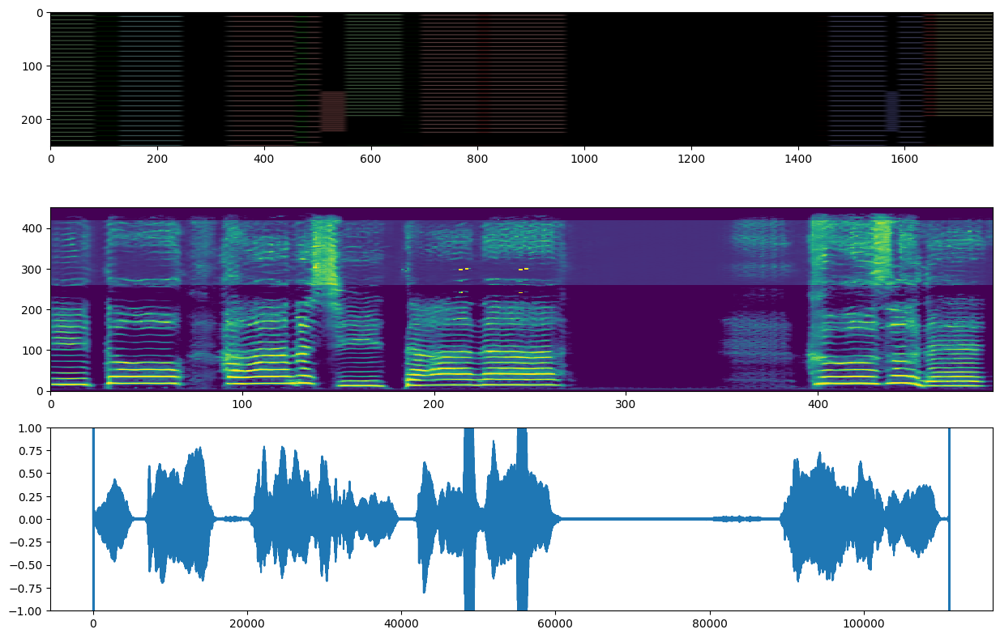

In [30]:
#@title Which phrase do you want to sing? / 확인하고 싶은 데이터셋 번호 { display-mode: "form" }

DatasetNo = 7 #@param {type:"number"}

prediction = generator(tf.expand_dims(x_tensor[DatasetNo], 0), training=True)[0]
prediction = tf.math.pow(10, 2.5*prediction - 1) *20

#prediction = tf.image.resize(prediction, [401, 552], antialias=False).numpy()
prediction = tf.image.resize(prediction, [451, 491], antialias=False).numpy()

prediction[:3] = 0.0001
prediction[260:420] = prediction[260:420] * 5

#prediction[6:11, 190:240] = 0

#prediction[prediction < 0.0001] = 0.000001
result = librosa.griffinlim(np.abs(prediction[:, :, 0]), n_fft=900, center=False)
#result = librosa.griffinlim(np.abs(prediction[:, :, 0]), n_fft=800, center=False)

plt.figure(figsize=(15, 10))

plt.subplot(3, 1, 1)
r1 = tf.image.resize(x_tensor[DatasetNo], [251, 1765], antialias=True)
plt.imshow(r1)

plt.subplot(3, 1, 2)
r1 = prediction[:, :, 0]
plt.pcolormesh(r1, norm=LogNorm(vmin=0.02, vmax=20))

plt.subplot(3, 1, 3)
plt.ylim(-1, 1)
plt.plot(result)

In [31]:
#@title Save Your Result / 결과 파일 저장

ResultFileName = "test" #@param {type: "string"}

rate = 22050
#write('drive/MyDrive/kiritan/result/'+DatasetName+'/'+ResultFileName+'.wav', rate, result[500:220000])
ipd.Audio(result[500:110000], rate=rate)